In [254]:
import pandas as pd
from os import path
import matplotlib.pyplot as plt
from scipy import signal, interpolate
import numpy as np
import folium
from scipy.spatial.distance import cdist
from scipy.stats import pearsonr

import keras



In [255]:
source_path = r"C:\Users\joses\Mi unidad\TRABAJO\49_profile_estimation\TRABAJO\spectrogram_based\datasets\metrotranvia"

win_len = 500

speed_stopped_th = .0 # m/s

# Data Extraction

t_0_acc=0.168568115234375, t_0_loc=0.446


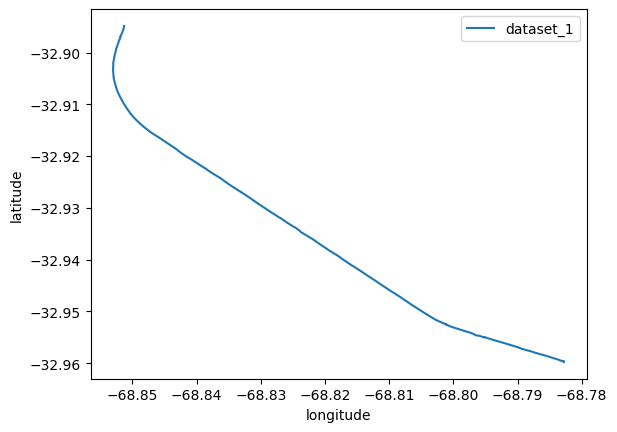

In [256]:
fs_acc = 100 # sps


def load_dataset_n(path_n: str, i_ini: int, i_fin: int, n_dataset: int = 0, subtract_g: float = -1, plot: bool = True):
    loc_orig_df_n = pd.read_csv(path.join(source_path, path_n, "Location.csv"))
    t_0_loc = loc_orig_df_n['seconds_elapsed'][0]
    acc_orig_df_n = pd.read_csv(path.join(source_path, path_n, "Accelerometer.csv"))
    t_0_acc = acc_orig_df_n['seconds_elapsed'][0]

    print(f"{t_0_acc=}, {t_0_loc=}")

    loc_orig_df_n = loc_orig_df_n.loc[loc_orig_df_n['speed'] >= speed_stopped_th].reset_index()

    loc_orig_df_n = loc_orig_df_n.iloc[i_ini:i_fin, :].reset_index()
    acc_orig_df_n = acc_orig_df_n.loc[acc_orig_df_n['seconds_elapsed'] >= i_ini].loc[acc_orig_df_n['seconds_elapsed'] <= i_fin].reset_index()


    if subtract_g:
        acc_orig_df_n['z'] = acc_orig_df_n['z'] + subtract_g*9.81

    if plot:
        plt.plot(loc_orig_df_n['longitude'], loc_orig_df_n['latitude'], label=f'dataset_{n_dataset}')
        plt.xlabel('longitude')
        plt.ylabel('latitude')
        plt.legend()
        plt.show()

    return loc_orig_df_n, acc_orig_df_n


# Dataset 1
i_ini, i_fin = 0, 10000 # s
loc_orig_df_1, acc_orig_df_1 = load_dataset_n(source_path, i_ini, i_fin, 1, plot=True, subtract_g=0)




## Raw Visualization

In [257]:
import plotly.graph_objects as go


fig = go.Figure()
fig.add_trace(go.Scatter(
    x=acc_orig_df_1['seconds_elapsed'], 
    y=acc_orig_df_1['z'],
    mode='lines',
    name='acc_z'
))
fig.add_trace(go.Scatter(
    x=loc_orig_df_1['seconds_elapsed'], 
    y=loc_orig_df_1['speed'],
    mode='lines',
    name='speed'
))
fig.update_layout(
    xaxis=dict(title='seconds elapsed'),
    legend=dict(title='Legend')
)
fig.show()

# Feature extraction

Global spectrum

(0.0, 25.0)

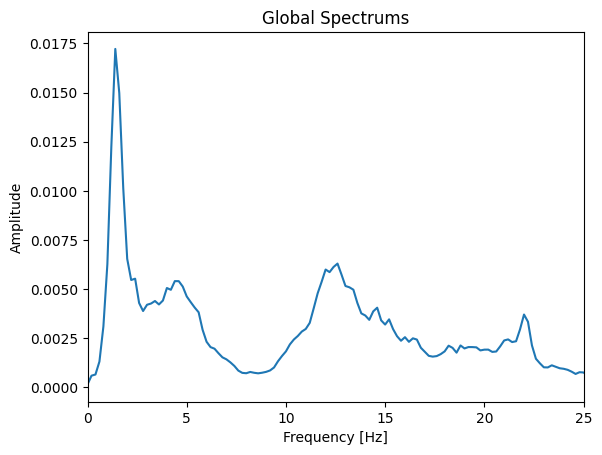

In [258]:
flim = (0, 25)
f = np.linspace(0, fs_acc/2, win_len//2 + 1)
global_spectrum_1 = signal.welch(acc_orig_df_1['z'].values, fs=fs_acc, nperseg=win_len, noverlap=win_len//2)[1]
fig, ax = plt.subplots(1, 1, sharex='col')
ax.plot(f, global_spectrum_1, label='global spectrum 1')
ax.set_title('Global Spectrums')
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel('Amplitude')
ax.set_xlim(flim)

## Spectrograms

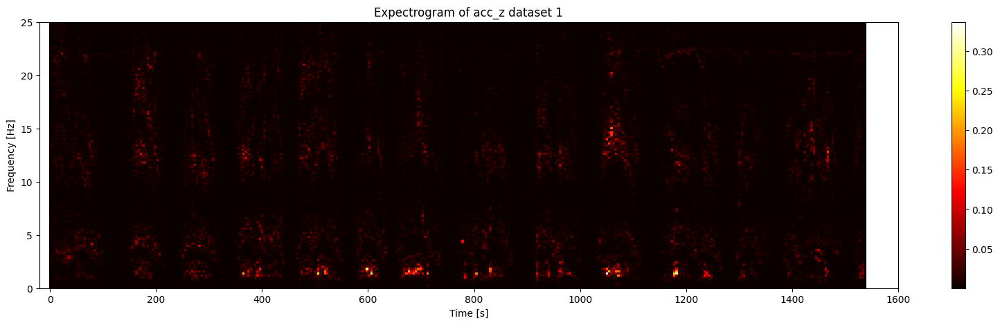

In [264]:
# plot expectrograms of acc_z
# Expectrograms

def plot_spectrogram(spectrogram_, ax=None, tlim=None, flim=None, title=None, spatial=False, x_index=False):
    f, t, Sxx = spectrogram_
    if x_index:
        t = np.arange(len(t))
    if ax is None:
        fig, ax = plt.subplots(figsize=(20, 5))
    im = ax.pcolormesh(t, f, Sxx, shading=None, cmap='hot')
    ax.set_ylabel('Frequency [Hz]' if not spatial else 'Spatial frequency [1/m]')
    ax.set_xlabel('Time [s]' if not x_index else 'Sample index')
    fig.colorbar(im, ax=ax)
    if tlim is not None:
        ax.set_xlim(tlim)
    if flim is not None:
        ax.set_ylim(flim)
    ax.set_title(title if title else 'Spectrogram')

    return ax

def get_spectrogram(acc_orig_df_n, fs, win_len):
    # Compute the spectrogram
    f, t, Sxx = signal.spectrogram(acc_orig_df_n['z'], fs=fs, nperseg=win_len)
    # Correct the time vector using seconds_elapsed
    t = np.interp(t, np.linspace(t[0], t[-1], len(acc_orig_df_n['seconds_elapsed'])), acc_orig_df_n['seconds_elapsed'])
    return (f, t, Sxx)

spectrogram_1 = get_spectrogram(acc_orig_df_1, fs=fs_acc, win_len=win_len)

tmax = 1600
tlim = (-20, tmax)
ax = plot_spectrogram(spectrogram_1, tlim=tlim, flim=flim, title='Expectrogram of acc_z dataset 1')

Normalized spectrograms

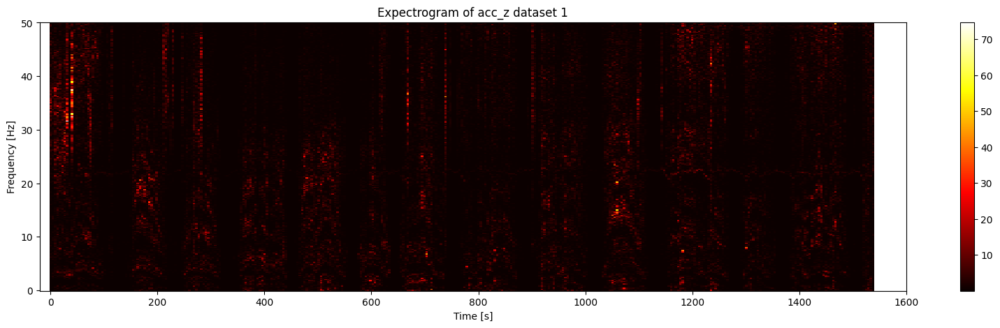

In [265]:
spectrogram_1_norm = (spectrogram_1[0], spectrogram_1[1], spectrogram_1[2]/global_spectrum_1.reshape(-1, 1))

ax = plot_spectrogram(spectrogram_1_norm, tlim=tlim, title='Expectrogram of acc_z dataset 1')


## Spatial Spectrograms
$f = \text{temporal frequency}$

$f_s = \text{spatial frequency}$

$v = \text{vehicle speed}$

$f = v f_s$

(-20.0, 1600.0)

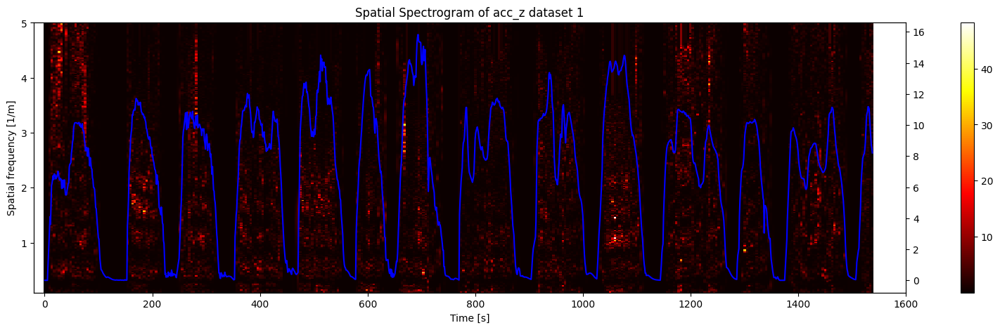

In [266]:
min_wl = 0.2  # meter
max_wl = 10.0  # meter

def get_spatial_spectrogram(spectrogram: tuple, tv: np.ndarray, min_wl: float, max_wl: float) -> tuple:
    spatial_frequencies = np.linspace(1/max_wl, 1/min_wl, len(spectrogram[0]))
    f, t, Sxx = spectrogram
    Sxx_spatial = 0 * Sxx
    for i, t_ in enumerate(t):
        Sxx_spatial[:, i] = np.interp(np.interp(t_, tv[:,0], tv[:,1])*spatial_frequencies, f, Sxx[:, i])
    return spatial_frequencies, t, Sxx_spatial

spatial_spectrogram_1_norm = get_spatial_spectrogram(spectrogram_1_norm, loc_orig_df_1[['seconds_elapsed', 'speed']].values, min_wl, max_wl)

# Plots
ax = plot_spectrogram(spatial_spectrogram_1_norm, tlim=tlim, title='Spatial Spectrogram of acc_z dataset 1', spatial=True)
ax_twin = ax.twinx()
ax_twin.plot(loc_orig_df_1['seconds_elapsed'], loc_orig_df_1['speed'], color='blue', label='speed 1')
ax_twin.set_xlim(tlim)

In [267]:
# RMS of acceleration
def rolling_rms(acc_orig_df):
    acc2_cum = np.cumsum(acc_orig_df['z']**2)
    acc_rms = np.zeros(acc_orig_df.shape[0])
    for i in range(acc_orig_df.shape[0]-win_len):
        acc_rms[i+win_len] = np.sqrt((acc2_cum[i+win_len] - acc2_cum[i])/win_len)
    acc_feat_df = pd.DataFrame(data=np.vstack((acc_orig_df['seconds_elapsed'].values, acc_rms)).T, 
                                columns=['seconds_elapsed', 'z_rolling_rms']).fillna(0)
    acc_feat_df.reset_index(inplace=True)
    first_non_zero = np.nonzero(acc_feat_df['z_rolling_rms'].values)[0][0]
    acc_feat_df['z_rolling_rms'].values[:first_non_zero] = acc_feat_df['z_rolling_rms'].values[first_non_zero]
    return acc_feat_df

acc_feat_df_1 = rolling_rms(acc_orig_df_1)


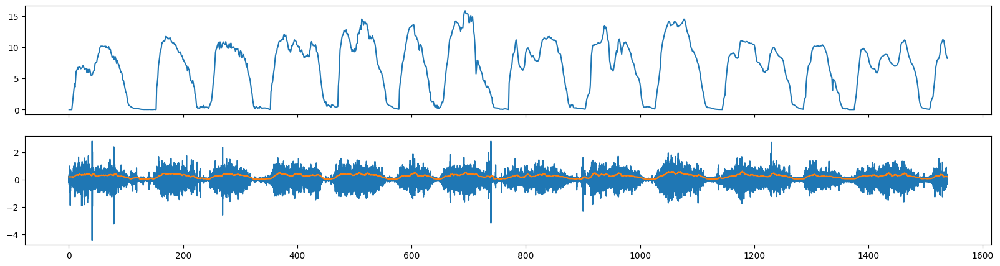

In [268]:
fig, ax = plt.subplots(2, 1, figsize=(20, 5), sharex='all', sharey='row')
ax[0].plot(loc_orig_df_1['seconds_elapsed'], loc_orig_df_1['speed'])
ax[1].plot(acc_orig_df_1['seconds_elapsed'], acc_orig_df_1['z'])
ax[1].plot(acc_feat_df_1['seconds_elapsed'], acc_feat_df_1['z_rolling_rms'])
plt.show()

### Low frequency features

In [269]:
def calc_features_lf_n(loc_orig_df_n, acc_feat_df_n, spectrogram_, spatial_spectrogram_):
    features_lf_n = loc_orig_df_n.loc[:, :]
    features_lf_n['z_rolling_rms'] = \
    np.interp(x=loc_orig_df_n['seconds_elapsed'], 
              xp=acc_feat_df_n['seconds_elapsed'].values-((win_len/fs_acc)/2), fp=acc_feat_df_n['z_rolling_rms'])
    features_lf_n = features_lf_n.drop(columns=['level_0']).reset_index()

    # add spectrogram features (1 column for each frequency bin)
    f, t, Sxx = spectrogram_
    interp_spectrogram = np.array([
        np.interp(x=loc_orig_df_n['seconds_elapsed'], xp=t, fp=Sxx[i])
        for i in range(Sxx.shape[0])
    ])

    spectro_cols = [f'spectrogram_{f[i]}Hz' for i in range(Sxx.shape[0])]
    spectro_df = pd.DataFrame(interp_spectrogram.T, columns=spectro_cols)

    features_lf_n = pd.concat([features_lf_n.reset_index(drop=True), spectro_df], axis=1)

    # add spatial spectrogram (1 column for each spatial frequency bin)
    fs, t, Sxx_spatial = spatial_spectrogram_
    interp_spectrogram_spatial = np.array([
        np.interp(x=loc_orig_df_n['seconds_elapsed'], xp=t, fp=Sxx_spatial[i])
        for i in range(Sxx_spatial.shape[0])
    ])
    spectro_cols_spatial = [f'spatial_spectrogram_{fs[i]}/m' for i in range(Sxx_spatial.shape[0])]
    spectro_df_spatial = pd.DataFrame(interp_spectrogram_spatial.T, columns=spectro_cols_spatial)
    
    features_lf_n = pd.concat([features_lf_n.reset_index(drop=True), spectro_df_spatial], axis=1)

    return features_lf_n


features_lf_1 = calc_features_lf_n(loc_orig_df_1, acc_feat_df_1, spectrogram_1_norm, spatial_spectrogram_1_norm)


### Location matching

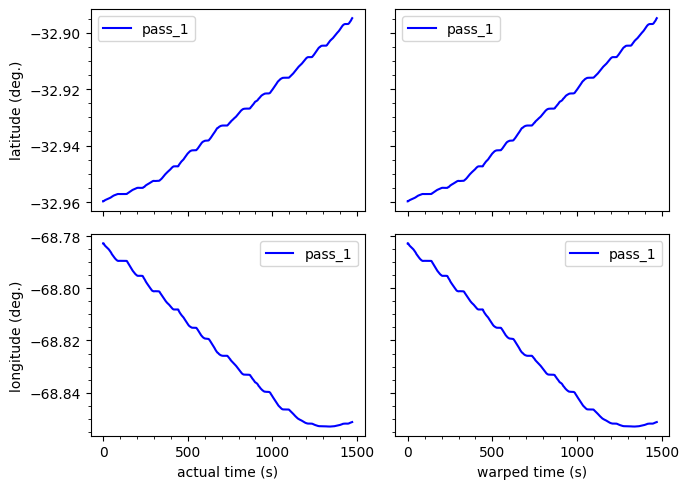

In [270]:

fig, ax = plt.subplots(2, 2, figsize=(7, 5), sharey='row', sharex='col')

ax[0,0].plot(loc_orig_df_1['latitude'].values, color='blue', label='pass_1')
ax[1,0].plot(loc_orig_df_1['longitude'].values, color='blue', label='pass_1')


ax[0,1].plot(loc_orig_df_1['latitude'].values, color='blue', label='pass_1')
ax[1,1].plot(loc_orig_df_1['longitude'].values, color='blue', label='pass_1')

ax[0,0].set_ylabel('latitude (deg.)')
ax[1,0].set_ylabel('longitude (deg.)')
ax[1,0].set_xlabel('actual time (s)')
ax[1,1].set_xlabel('warped time (s)')

for __ in ax:
    for _ in __:
        _.minorticks_on()
        _.legend()

fig.tight_layout()
plt.show()
fig.savefig('location_based_dtw.pdf')

In [271]:
from plotly.subplots import make_subplots

import plotly.graph_objects as go

# First figure: time series plots
fig1 = make_subplots(rows=2, cols=1,
                     shared_xaxes=True,
                     subplot_titles=("Speed vs Time", "RMS Acceleration vs Time"))
fig1.add_trace(go.Scatter(x=features_lf_1['seconds_elapsed'],
                          y=features_lf_1['speed'],
                          mode='lines',
                          name='Speed'),
               row=1, col=1)
fig1.add_trace(go.Scatter(x=features_lf_1['seconds_elapsed'],
                          y=features_lf_1['z_rolling_rms'],
                          mode='lines',
                          name='rms Acceleration'),
               row=2, col=1)

fig1.update_xaxes(title_text="Time (s)", row=2, col=1)
fig1.update_yaxes(title_text="Speed (m/s)", row=1, col=1)
fig1.update_yaxes(title_text="rms acc. (m/s²)", row=2, col=1)
fig1.show()

# Second figure: scatter plot
fig2 = make_subplots(rows=1, cols=2,
                     shared_yaxes=True,
                     subplot_titles=("Speed vs rms Acc", ""))
fig2.add_trace(go.Scatter(x=features_lf_1['z_rolling_rms'],
                          y=features_lf_1['speed'],
                          mode='lines+markers',
                          name='Data'),
               row=1, col=1)

fig2.update_xaxes(title_text="rms acc. (m/s²)", row=1, col=1, range=[0,1])
fig2.update_yaxes(title_text="Speed (m/s)", row=1, col=1, range=[0,18])
fig2.show()

# Matched spectrograms

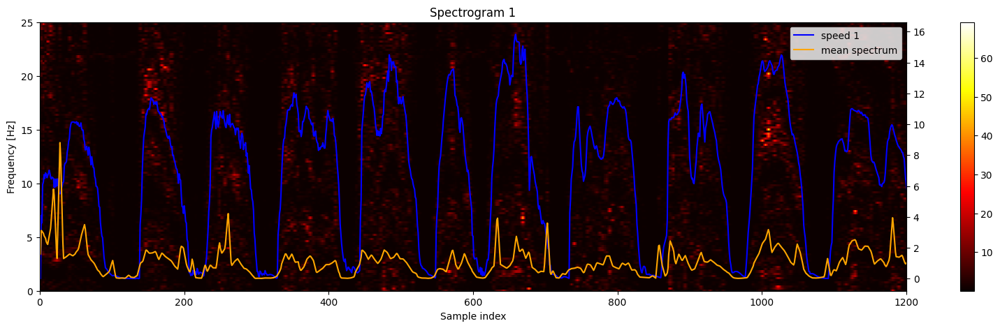

In [272]:
# Matched spectrograms

spectrogram_from_lf_1_ = features_lf_1.loc[:, ['seconds_elapsed'] + [col for col in features_lf_1.columns if ('spectrogram_' in col and 'Hz' in col)]].values
spectrogram_from_lf_1 = (np.linspace(0, fs_acc/2, spectrogram_from_lf_1_.shape[1]-1), spectrogram_from_lf_1_[:,0], spectrogram_from_lf_1_[:, 1:].T)

ilim = (0, 1200)

ax = plot_spectrogram(spectrogram_from_lf_1, tlim=tlim, flim=flim, title='Spectrogram 1', x_index=True)
ax_twin = ax.twinx()
ax_twin.plot(features_lf_1['speed'], color='blue', label='speed 1')
ax_twin.plot(np.mean(spectrogram_from_lf_1[2], axis=0), label='mean spectrum', color='orange')
ax_twin.set_xlim(ilim)
ax_twin.legend()

## Velocity normalized spectrograms

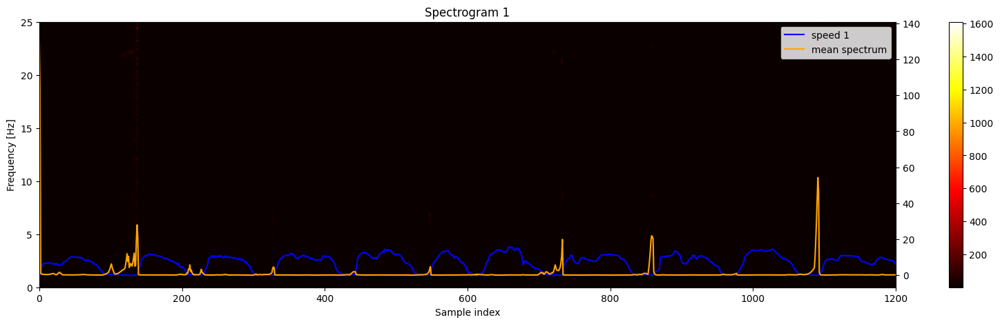

In [295]:
regularization = 0.001

spectrogram_from_lf_1_vel_norm = (
    spectrogram_from_lf_1[0], spectrogram_from_lf_1[1], 
    (spectrogram_from_lf_1[2] + regularization*np.max(spectrogram_from_lf_1[2].flatten())) 
    / (regularization*np.max(features_lf_1['speed'].values) + features_lf_1['speed'].values.reshape(1, -1))
    )

ax = plot_spectrogram(spectrogram_from_lf_1_vel_norm, tlim=ilim, flim=(0, 25), title='Spectrogram 1', x_index=True)
ax_twin = ax.twinx()
ax_twin.plot(features_lf_1['speed'], color='blue', label='speed 1')
ax_twin.plot(np.mean(spectrogram_from_lf_1_vel_norm[2], axis=0), label='mean spectrum', color='orange')
ax_twin.legend()


## Drop based on Speed threshold 

In [ ]:
# TODO

## Matched Spatial spectrograms
$\frac{1}{s} \frac{s}{m}=\frac{1}{m}$


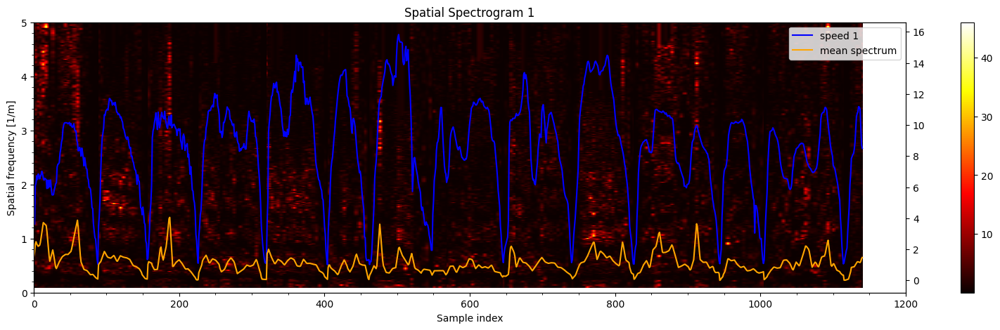

In [175]:
# Matched spatial spectrograms

spatial_spectrogram_from_lf_1_ = features_lf_1.loc[:, ['seconds_elapsed'] + [col for col in features_lf_1.columns if 'spatial_spectrogram_' in col]].values
spatial_spectrogram_from_lf_1 = (np.linspace(1/max_wl, 1/min_wl, spatial_spectrogram_from_lf_1_.shape[1]-1), spatial_spectrogram_from_lf_1_[:,0], spatial_spectrogram_from_lf_1_[:, 1:].T)

ax = plot_spectrogram(spatial_spectrogram_from_lf_1, tlim=tlim, flim=(0, 5), title='Spatial Spectrogram 1', spatial=True, x_index=True)
ax.minorticks_on()
ax_twin = ax.twinx()
ax_twin.plot(features_lf_1['speed'], color='blue', label='speed 1')
ax_twin.plot(np.mean(spatial_spectrogram_from_lf_1[2], axis=0), label='mean spectrum', color='orange')
ax_twin.set_xlim(ilim)
ax_twin.legend()


# Global of FRF normalized - velocity normalized - spatial spectrograms

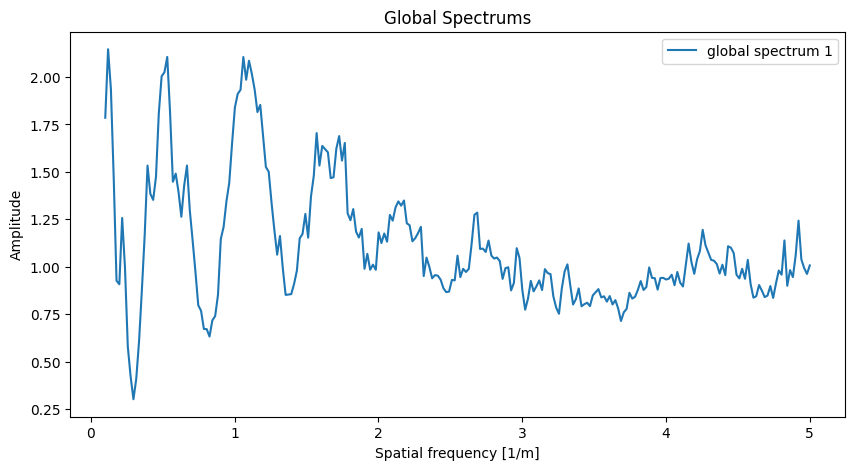

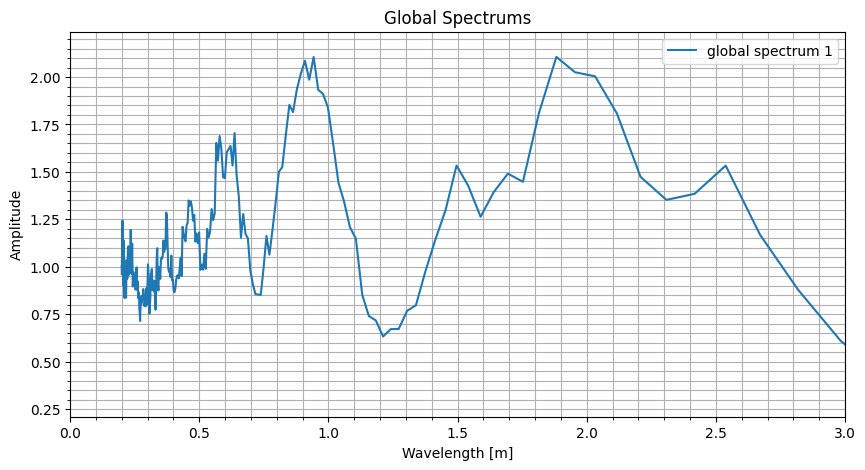

In [176]:
# Global of FRF normalized - velocity normalized - spatial spectrum
f, t, Sxx = spatial_spectrogram_from_lf_1
global_spectrum_1_vel_norm = np.mean(Sxx, axis=1)
# Plot Global of FRF normalized - velocity normalized - spatial spectrum
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(f, global_spectrum_1_vel_norm, label='global spectrum 1')
ax.set_title('Global Spectrums')
ax.set_xlabel('Spatial frequency [1/m]')
ax.set_ylabel('Amplitude')
ax.legend()
plt.show()

# The same, but in terms of wavelength
wllim = (0, 3)  # m
f, t, Sxx = spatial_spectrogram_from_lf_1
global_spectrum_1_wl_norm = np.mean(Sxx, axis=1)
wavelengths = 1 / f
# Plot Global of FRF normalized - velocity normalized - spatial spectrum in terms of wavelength
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(wavelengths, global_spectrum_1_wl_norm, label='global spectrum 1')  
ax.set_title('Global Spectrums')
ax.set_xlabel('Wavelength [m]')
ax.set_ylabel('Amplitude')
ax.set_xlim(wllim)
ax.legend()
ax.minorticks_on()
ax.grid(which='both')
plt.show()


# sleepers separation: 0.66 m

## Plot spatial spectral line corresponding to sleepers

In [177]:
import numpy as np

sleeper_wavelength = 0.66  # meters
sleeper_freq = 1 / sleeper_wavelength
f_i_window = 10

f, t, Sxx = spatial_spectrogram_from_lf_1

i_spectral_line = np.argmin(np.abs(f - sleeper_freq))

intensity = np.mean(
    Sxx[i_spectral_line-f_i_window//2:i_spectral_line+f_i_window//2, :],
    axis=0
    )
intensity /= max(intensity)


n_peaks = 10
peak_mask = [i for i in range(1, len(intensity)-1) if intensity[i] > intensity[i-1] and intensity[i] > intensity[i+1]]
peaks_indices_all = np.argsort(intensity)[::-1]
peaks_indices = [i for i in peaks_indices_all if i in peak_mask][:n_peaks]
print(f"{peaks_indices=}")


import plotly.graph_objects as go

fig = go.Figure()

# Plot the intensity as a line
fig.add_trace(go.Scatter(
    x=list(range(len(intensity))),
    y=intensity,
    mode='lines',
    name='Intensity'
))

# Plot peaks as red markers
fig.add_trace(go.Scatter(
    x=np.array(peaks_indices),
    y=intensity[np.array(peaks_indices)],
    mode='markers',
    marker=dict(color='red', size=10),
    name='Peaks'
))

# Add RMS acceleration on a secondary y-axis
fig.add_trace(go.Scatter(
    x=list(range(len(features_lf_1['z_rolling_rms']))),
    y=features_lf_1['z_rolling_rms']/max(features_lf_1['z_rolling_rms'].values),
    mode='lines',
    line=dict(color='orange'),
    name='RMS Acc'
))

fig.update_layout(
    title='Spectral Line Intensity at Sleeper Frequency',
    xaxis_title='Sample index',
    yaxis=dict(title='Intensity'),
    yaxis2=dict(title='Normalized RMS Acceleration (m/s²)/(m/s²)', overlaying='y', side='right'),
    legend=dict(x=0.01, y=0.99),
)

fig.show()


peaks_indices=[119, 771, 668, 427, 110, 136, 852, 502, 175, 444]


(0.0, 1.0)

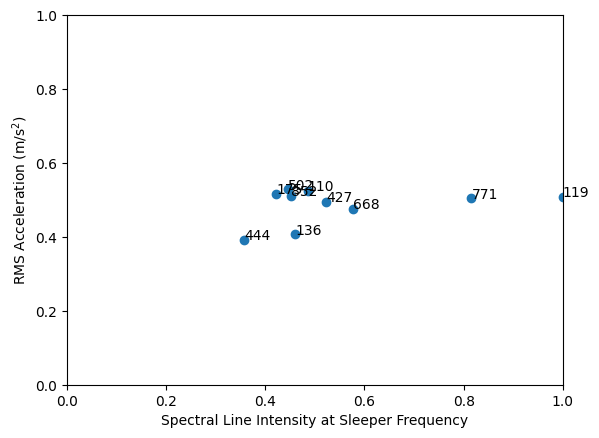

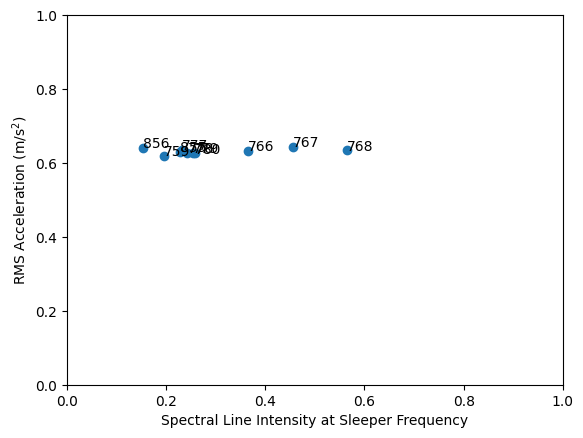

In [178]:
# For each plot a correlation coeficient between peaks intensity and rms acc.
plt.figure()
plt.scatter(intensity[peaks_indices], features_lf_1['z_rolling_rms'].values[peaks_indices]) 
plt.xlabel('Spectral Line Intensity at Sleeper Frequency')
plt.ylabel('RMS Acceleration (m/s$^2$)')
for i, txt in enumerate(peaks_indices):
    plt.annotate(txt, (intensity[txt], features_lf_1['z_rolling_rms'].values[txt]))
plt.xlim(0, 1)
plt.ylim(0, 1)

peaks_indices_rms = np.argsort(features_lf_1['z_rolling_rms'].values)[::-1][:n_peaks]
# For each plot a correlation coeficient between peaks intensity and rms acc.
plt.figure()
plt.scatter(intensity[peaks_indices_rms], features_lf_1['z_rolling_rms'].values[peaks_indices_rms]) 
plt.xlabel('Spectral Line Intensity at Sleeper Frequency')
plt.ylabel('RMS Acceleration (m/s$^2$)')
for i, txt in enumerate(peaks_indices_rms):
    plt.annotate(txt, (intensity[txt], features_lf_1['z_rolling_rms'].values[txt]))
plt.xlim(0, 1)
plt.ylim(0, 1)

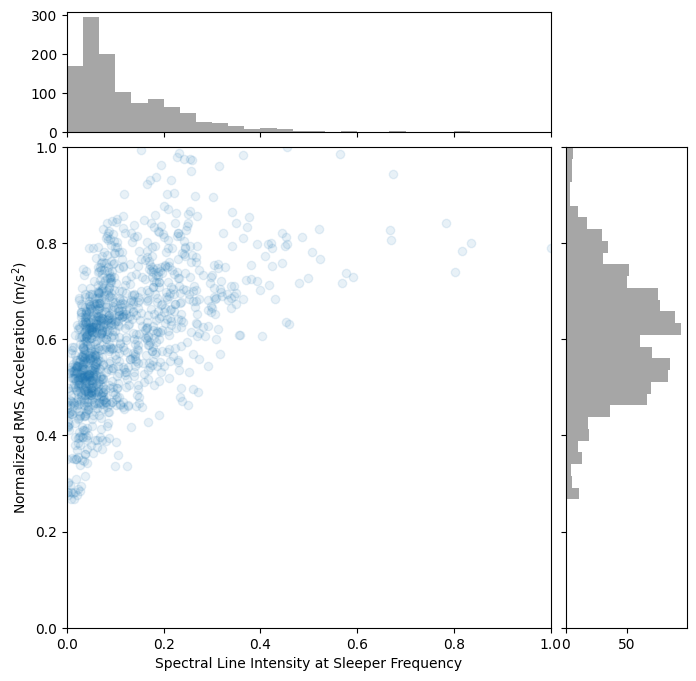

In [179]:
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(8, 8))
gs = gridspec.GridSpec(2, 2, width_ratios=[4, 1], height_ratios=[1, 4],
                       wspace=0.05, hspace=0.05)

# Main scatter plot
ax_scatter = plt.subplot(gs[1, 0])
# Histogram on the top
ax_histx = plt.subplot(gs[0, 0], sharex=ax_scatter)
# Histogram on the right
ax_histy = plt.subplot(gs[1, 1], sharey=ax_scatter)

# Scatter plot
ax_scatter.scatter(intensity,
                   features_lf_1['z_rolling_rms'].values/max(features_lf_1['z_rolling_rms'].values),
                   alpha=0.1)
ax_scatter.set_xlabel('Spectral Line Intensity at Sleeper Frequency')
ax_scatter.set_ylabel('Normalized RMS Acceleration (m/s$^2$)')
ax_scatter.set_xlim(0, 1)
ax_scatter.set_ylim(0, 1)

# Histograms
ax_histx.hist(intensity, bins=30, color='grey', alpha=0.7)
ax_histy.hist(features_lf_1['z_rolling_rms'].values/max(features_lf_1['z_rolling_rms'].values), 
              bins=30, orientation='horizontal', color='grey', alpha=0.7)

# Hide x labels for ax_histx and y labels for ax_histy
plt.setp(ax_histx.get_xticklabels(), visible=False)
plt.setp(ax_histy.get_yticklabels(), visible=False)

plt.show()

## Other spectral lines

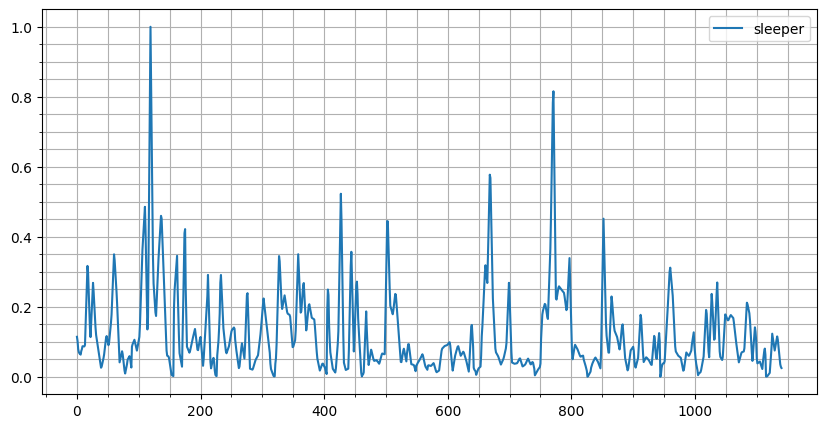

In [190]:
wave_defs = [
    {"name": "sleeper", "wavelength": 0.66}
]

# spatial_spectrogram_from_lf_1 already defined in a previous cell
f, t, Sxx = spatial_spectrogram_from_lf_1

fig, ax = plt.subplots(figsize=(10, 5))
for wave in wave_defs:
    freq = 1 / wave["wavelength"]
    i_spectral_line = np.argmin(np.abs(f - freq))
    intensity = np.mean(
        Sxx[i_spectral_line - f_i_window//2 : i_spectral_line + f_i_window//2, :],
        axis=0
    )
    intensity /= max(intensity)  # normalize
    ax.plot(intensity, label=wave["name"])

ax.minorticks_on()
ax.grid(which='both')
ax.legend()
plt.show()

# The same with plotly
import plotly.graph_objects as go
fig = go.Figure()
for wave in wave_defs:
    freq = 1 / wave["wavelength"]
    i_spectral_line = np.argmin(np.abs(f - freq))
    intensity = np.mean(
        Sxx[i_spectral_line - f_i_window//2 : i_spectral_line + f_i_window//2, :],
        axis=0
    )
    intensity /= max(intensity)
    fig.add_trace(go.Scatter(x=list(range(len(t))), y=intensity, mode='lines', name=wave["name"]))
fig.update_layout(
    title='Spectral Line Intensity at Different Wavelengths',
    xaxis_title='sample index',
    yaxis_title='Normalized Intensity',
    xaxis=dict(tickmode='linear', dtick=100),
    yaxis=dict(tickmode='linear', dtick=0.1)
)
fig.show()


# The same but time-smoothed
def smooth_intensity(intensity, window_size=5):
    """Smooth the intensity using a simple moving average."""
    return np.convolve(intensity, np.ones(window_size)/window_size, mode='valid')

fig = go.Figure()
for wave in wave_defs:
    freq = 1 / wave["wavelength"]
    i_spectral_line = np.argmin(np.abs(f - freq))
    intensity = np.mean(
        Sxx[i_spectral_line - f_i_window//2 : i_spectral_line + f_i_window//2, :],
        axis=0
    )
    intensity /= max(intensity)
    smoothed_intensity = smooth_intensity(intensity, window_size=50)
    fig.add_trace(go.Scatter(x=list(range(len(smoothed_intensity))), y=smoothed_intensity,
                             mode='lines', name=wave["name"]))
fig.update_layout(
    title='Smoothed Spectral Line Intensity at Different Wavelengths',
    xaxis_title='Sample Index',
    yaxis_title='Normalized Intensity',
    xaxis=dict(tickmode='linear', dtick=100),
    yaxis=dict(tickmode='linear', dtick=0.1)
)
fig.show()

# Map

In [192]:
import webbrowser
from matplotlib.colors import Normalize


indices = np.arange(len(loc_orig_df_1))

# Map
circ_rad = 5

norm = Normalize(vmin=0, vmax=1)

def value_to_reds(value):
    cmap = plt.colormaps['Reds']
    rgba = cmap(norm(value))
    return f'#{int(rgba[0]*255):02x}{int(rgba[1]*255):02x}{int(rgba[2]*255):02x}'

def value_to_blues(value):
    cmap = plt.colormaps['Blues']
    rgba = cmap(norm(value))
    return f'#{int(rgba[0]*255):02x}{int(rgba[1]*255):02x}{int(rgba[2]*255):02x}'

# Create a map centered at the mean latitude and longitude of loc_orig_df_2
center_lat = loc_orig_df_1['latitude'].mean()
center_lon = loc_orig_df_1['longitude'].mean()
mymap = folium.Map(location=[center_lat, center_lon], zoom_start=10, tiles='OpenStreetMap')

# Plot the latitude and longitude data on the map
for index in range(loc_orig_df_1.shape[0]):
    row1 = loc_orig_df_1.iloc[index,:]
    folium.Circle([row1['latitude'], row1['longitude']],
                        radius=circ_rad,
                        color=value_to_reds(intensity[index]),
                        fill=False).add_to(mymap)
    # folium.Circle([row1['latitude'], row1['longitude']],
    #               radius=circ_rad/2,
    #               color=value_to_blues(features_lf_1['z_rolling_rms'].values[index]),
    #               fill=False).add_to(mymap)
    
    # Add sample numbers every 10th point
    if index % 50 == 0:
        folium.Marker(
            [row1['latitude'], row1['longitude']],
            icon=folium.DivIcon(html=f"""<div style="font-size: 12pt; color : gray"><b>{index}</b></div>""")
        ).add_to(mymap)
    # and at:
    if index % 100 == 0:
        folium.Marker(
            [row1['latitude'], row1['longitude']],
            icon=folium.DivIcon(html=f"""<div style="font-size: 16pt; color : black"><b>{index}</b></div>""")
        ).add_to(mymap)

    # key places
    if index in peaks_indices:
        folium.Marker(
            [row1['latitude'], row1['longitude']],
            icon=folium.DivIcon(html=f"""<div style="font-size: 20pt; color : red"><b>{index}</b></div>""")
        ).add_to(mymap)

# Save the map to an HTML file
mymap.save("map_acc.html")

# open in browser
webbrowser.open("map_acc.html")


True

# Predict rms_acc as a function of speed for each place

## and spatial spectrogram

In [183]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

In [184]:
f, t, Sxx_spatial = spatial_spectrogram_from_lf_1
X_spatial = np.hstack((Sxx_spatial.T, features_lf_1[['speed']].values))
y = features_lf_1[['z_rolling_rms']].values
X_spatial.shape, y.shape

((1141, 252), (1141, 1))

In [185]:
# validation
X_spatial_train, X_spatial_test, y_train, y_test = train_test_split(
    X_spatial, y, test_size=0.2, random_state=123, shuffle=True
    )

# scaling
scaler_X_spatial = MinMaxScaler().fit(X_spatial)
scaler_y = MinMaxScaler().fit(y)

X_spatial_norm_train = scaler_X_spatial.transform(X_spatial_train)
X_spatial_norm_test = scaler_X_spatial.transform(X_spatial_test)
y_norm_train = scaler_y.transform(y_train)
y_norm_test = scaler_y.transform(y_test)

# model
model_spatial = RandomForestRegressor(n_estimators=10)
model_spatial.fit(X=X_spatial_norm_train, y=y_norm_train[:, 0])

RandomForestRegressor(n_estimators=10)

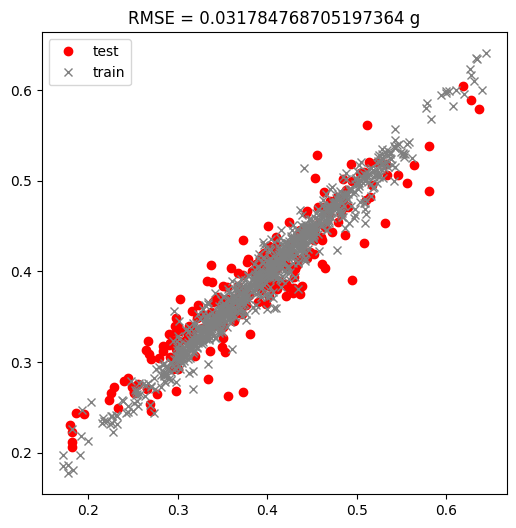

In [186]:
y_test_pred_spatial = scaler_y.inverse_transform(model_spatial.predict(X_spatial_norm_test).reshape(-1,1))
# plot
fig, ax = plt.subplots(1, 1, figsize=(6,6))
ax.plot(scaler_y.inverse_transform(y_norm_test), y_test_pred_spatial, 
        color="red", label='test', linestyle='none', marker='o')
ax.plot(scaler_y.inverse_transform(y_norm_train), scaler_y.inverse_transform(model_spatial.predict(X_spatial_norm_train).reshape(-1,1)), 
        color="grey", label='train', linestyle='none', marker='x')
ax.legend()
ax.set_title('RMSE = ' + str(np.sqrt(mean_squared_error(y_test, y_test_pred_spatial))) + ' g')
plt.show()

# and spectrogram

In [187]:
Sxx_temporal = spectrogram_from_lf_1_.T
X_temporal = np.hstack((Sxx_temporal.T, features_lf_1[['speed']].values))
y = features_lf_1[['z_rolling_rms']].values
X_temporal.shape, y.shape

((1141, 253), (1141, 1))

In [188]:
# validation
X_temporal_train, X_temporal_test, y_train, y_test = train_test_split(
    X_temporal, y, test_size=0.2, random_state=123, shuffle=False
    )

# scaling
scaler_X_temporal = MinMaxScaler().fit(X_temporal)
scaler_y = MinMaxScaler().fit(y)

X_temporal_norm_train = scaler_X_temporal.transform(X_temporal_train)
X_temporal_norm_test = scaler_X_temporal.transform(X_temporal_test)
y_norm_train = scaler_y.transform(y_train)
y_norm_test = scaler_y.transform(y_test)

# model
model_temporal = RandomForestRegressor(n_estimators=10)
model_temporal.fit(X=X_temporal_norm_train, y=y_norm_train[:, 0])

RandomForestRegressor(n_estimators=10)

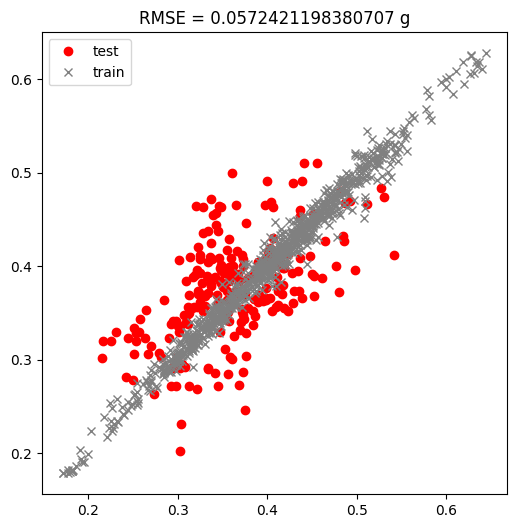

In [189]:
y_test_pred_temporal = scaler_y.inverse_transform(model_temporal.predict(X_temporal_norm_test).reshape(-1,1))
# plot
fig, ax = plt.subplots(1, 1, figsize=(6,6))
ax.plot(scaler_y.inverse_transform(y_norm_test), y_test_pred_temporal, 
        color="red", label='test', linestyle='none', marker='o')
ax.plot(scaler_y.inverse_transform(y_norm_train), scaler_y.inverse_transform(model_temporal.predict(X_temporal_norm_train).reshape(-1,1)), 
        color="grey", label='train', linestyle='none', marker='x')
ax.legend()
ax.set_title('RMSE = ' + str(np.sqrt(mean_squared_error(y_test, y_test_pred_temporal))) + ' g')
plt.show()

distancia_total(coords, ruta)=2333.2402258089614


True